# Image Description Model using Multimodal Space Embedding

The model architecture is similar to [DEEP CAPTIONING WITH MULTIMODAL RECURRENT NEURAL NETWORKS](https://arxiv.org/pdf/1412.6632.pdf).

This notebook is an end-to-end example. When the notebook is run, it downloads the [MS-COCO](http://cocodataset.org/#home) dataset, preprocesses and caches a subset of images using pre-trained CNN (i.e. DenseNet, VGG16, InceptionV3/GoogleNet and ResNet), trains a multimodal Recurrent Neural Network (m-RNN), and generates captions on new images using the trained model.

In [ ]:
!pip install --upgrade pip

     |████████████████████████████████| 1.5MB 5.4MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1


In [ ]:
!pip install tensorflow

In [ ]:
!pip install keras

In [ ]:
!pip install -U scikit-learn

     |████████████████████████████████| 6.8 MB 4.4 MB/s 
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1


In [ ]:
import tensorflow as tf

from tensorflow import keras

from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D
from keras import regularizers

# You'll generate plots of attention in order to see which parts of an image
# our model focuses on during captioning
import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle

Using TensorFlow backend.


## Download and prepare the MS-COCO dataset

[MS-COCO dataset](http://cocodataset.org/#home) is used to train our model. The dataset contains over 82,000 images, each of which has at least 5 different caption annotations. The code below downloads and extracts the dataset automatically.

**Caution: large download ahead**. We will use the training set, which is a 13GB file.

In [ ]:
# Download caption annotation files
annotation_folder = '/annotations/'
if not os.path.exists(os.path.abspath('.') + annotation_folder):
  annotation_zip = tf.keras.utils.get_file('captions.zip',
                                          cache_subdir=os.path.abspath('.'),
                                          origin = 'http://images.cocodataset.org/annotations/annotations_trainval2014.zip',
                                          extract = True)
  annotation_file_train = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
  annotation_file_test = os.path.dirname(annotation_zip)+'/annotations/captions_val2014.json'

  os.remove(annotation_zip)
else:
  annotation_file_train = os.path.abspath('.')+'/annotations/captions_train2014.json'
  annotation_file_test = os.path.abspath('.')+'/annotations/captions_val2014.json'

image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
  image_zip = tf.keras.utils.get_file('train2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin = 'http://images.cocodataset.org/zips/train2014.zip',
                                      extract = True)
  image_train_path = os.path.dirname(image_zip) + image_folder
  os.remove(image_zip)
else:
  image_train_path = os.path.abspath('.') + image_folder


13510574080/13510573713 [==============================] - 336s 0us/step


## Optional: limit the size of the training set 
To speed up training for demo purposes, we will use a subset of 30,000 captions and their corresponding images to train our model. Choosing to use more data would result in improved captioning quality.

In [ ]:
# Read the json file
with open(annotation_file_train, 'r') as f:
    annotations = json.load(f)

# Store captions and image names in vectors
all_captions = []
all_img_name_vector = []

for annot in annotations['annotations']:
    caption = '<start> ' + annot['caption'] + ' <end>'
    image_id = annot['image_id']
    full_coco_image_path = image_train_path + 'COCO_train2014_' + '%012d.jpg' % (image_id)

    all_img_name_vector.append(full_coco_image_path)
    all_captions.append(caption)

# Shuffle captions and image_names together
# Set a random state
train_captions, img_name_vector = shuffle(all_captions,
                                          all_img_name_vector,
                                          random_state=1)
# Select the first 30000 captions from the shuffled set
num_examples = 250000
train_captions = train_captions[:num_examples]
img_name_vector = img_name_vector[:num_examples]


In [ ]:
len(train_captions), len(all_captions)

(250000, 414113)

## Preprocess the images using pre-trained CNN on ImageNet
Next, you will use CNNs (which is pretrained on Imagenet) to classify each image. You will extract features from the last convolutional layer.

First, you will convert the images into CNN's expected format by:
* Resizing the image
* Preprocess the images using the preprocess_input method to normalize the image so that it contains pixels in the range of -1 to 1, which matches the format of the images used to train [DenseNet](https://www.tensorflow.org/api_docs/python/tf/keras/applications/DenseNet201)/[VGGNet](https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG16)/[InceptionV3](https://www.tensorflow.org/api_docs/python/tf/keras/applications/InceptionV3)/[ResNet](https://www.tensorflow.org/api_docs/python/tf/keras/applications/ResNet152V2).

In [ ]:
argument = 'VggNet16'

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    if argument == "DenseNet":
      img = tf.image.resize(img, (224, 224))
      img = tf.keras.applications.densenet.preprocess_input(img)
    elif argument == "VggNet16":
      img = tf.image.resize(img, (224, 224))
      img = tf.keras.applications.vgg16.preprocess_input(img)
    elif argument == "ResNet":
      img = tf.image.resize(img, (224, 224))
      img = tf.keras.applications.resnet_v2.preprocess_input(img)
    else:
      img = tf.image.resize(img, (299, 299))
      img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

## Initialize pre-trained CNN and load the pretrained Imagenet weights

Now we will create a tf.keras model where the output layer is the last convolutional layer in the [DenseNet](https://www.tensorflow.org/api_docs/python/tf/keras/applications/DenseNet201)/[VGGNet](https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG16)/[InceptionV3](https://www.tensorflow.org/api_docs/python/tf/keras/applications/InceptionV3)/[Resnet]() architecture. The shape of the output of this layer is ```1x1092```(DenseNet)/```1x4096```(VGGNet)/```1x2048```(InceptionV3)/```1x2048```(ResNet). We use the last convolutional layer. We don't perform this initialization during training because it could become a bottleneck.

* You forward each image through the network and store the resulting vector in a dictionary (image_name --> feature_vector).
* After all the images are passed through the network, you pickle the dictionary and save it to disk.

In [ ]:
# Get the function from switcher dictionary
if argument == "DenseNet":
  image_model = tf.keras.applications.DenseNet201(include_top=True,
                                                weights='imagenet')
  
elif argument == "VggNet16":
  image_model = tf.keras.applications.VGG16(include_top=True,
                                                weights='imagenet')
elif argument == "ResNet":
  image_model = tf.keras.applications.ResNet152V2(include_top=True,
                                                weights='imagenet')
else:
  image_model = tf.keras.applications.InceptionV3(include_top=True,
                                                weights='imagenet')
image_model.summary()
# image_model = cnn_model.get(argument)
# print(image_model)
new_input = image_model.input
hidden_layer = image_model.layers[-2].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

553467904/553467096 [==============================] - 4s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

In [ ]:
image_features_extract_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
image_features_extract_model.trainable = True

In [ ]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(image_features_extract_model.layers))

# # Fine-tune from this layer onwards
fine_tune_at = len(image_features_extract_model.layers) - 2

# # Freeze all the layers before the `fine_tune_at` layer
for layer in image_features_extract_model.layers[:fine_tune_at]:
  layer.trainable =  False

Number of layers in the base model:  22


## Caching the features extracted from DenseNet / VGGNet / InceptionV3 / ResNet

We will pre-process each image with DenseNet/ VGGNet/ InceptionV3/ ResNet and cache the output to disk. Caching the output in RAM would be faster but also memory intensive. At the time of writing, this exceeds the memory limitations of Colab (currently 12GB of memory).

Performance could be improved with a more sophisticated caching strategy (for example, by sharding the images to reduce random access disk I/O), but that would require more code.


In [ ]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)

for img, path in image_dataset:
  batch_features = image_features_extract_model(img)
  # print(batch_features.shape)
  # batch_features = tf.reshape(batch_features,
  #                             (batch_features.shape[0], -1, batch_features.shape[3]))
  # print(batch_features.shape)


  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

## Preprocess and tokenize the captions

* First, we will tokenize the captions (for example, by splitting on spaces). This gives us a  vocabulary of all of the unique words in the data (for example, "surfing", "football", and so on).
* You then create word-to-index and index-to-word mappings.
* Finally, you pad all sequences to be the same length as the longest one.

In [ ]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [ ]:

tokenizer = tf.keras.preprocessing.text.Tokenizer(
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [ ]:
print(tokenizer.word_index)

{'a': 1, '<start>': 2, '<end>': 3, 'on': 4, 'of': 5, 'the': 6, 'in': 7, 'with': 8, 'and': 9, 'is': 10, 'man': 11, 'to': 12, 'sitting': 13, 'an': 14, 'two': 15, 'standing': 16, 'people': 17, 'at': 18, 'are': 19, 'next': 20, 'white': 21, 'woman': 22, 'street': 23, 'table': 24, 'that': 25, 'holding': 26, 'some': 27, 'large': 28, 'person': 29, 'it': 30, 'down': 31, 'top': 32, 'group': 33, 'up': 34, 'field': 35, 'small': 36, 'near': 37, 'tennis': 38, 'his': 39, 'black': 40, 'front': 41, 'plate': 42, 'room': 43, 'train': 44, 'riding': 45, 'dog': 46, 'red': 47, 'young': 48, 'by': 49, 'cat': 50, 'water': 51, 'baseball': 52, 'has': 53, 'walking': 54, 'while': 55, 'playing': 56, 'bathroom': 57, 'sign': 58, 'blue': 59, 'food': 60, 'kitchen': 61, 'grass': 62, 'bus': 63, 'there': 64, 'green': 65, 'parked': 66, 'side': 67, 'pizza': 68, 'snow': 69, 'other': 70, 'bed': 71, 'looking': 72, 'building': 73, 'beach': 74, 'ball': 75, 'boy': 76, 'couple': 77, 'for': 78, 'three': 79, 'men': 80, 'toilet': 81, 

In [ ]:
# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

## Split the data into training and testing

In [ ]:
# Create training and validation sets using an 80-20 split
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    random_state=0)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(200000, 200000, 50000, 50000)

## Create a tf.data dataset for training


 Our images and captions are ready! Next, let's create a tf.data dataset to use for training our model.

In [ ]:
# Feel free to change these parameters according to your system's configuration

BATCH_SIZE = 512
BUFFER_SIZE = 1000
word_dim = 128
embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index) + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 49

In [ ]:
# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

## Model

The model architecture is inspired by the [DEEP CAPTIONING WITH MULTIMODAL RECURRENT NEURAL NETWORKS](https://arxiv.org/pdf/1412.6632.pdf) paper.

* We extract the features from the lower convolutional layer of DenseNet/ VGGNet/ InceptionV3/ ResNet.
* The RNN (here LSTM) attends over the image to predict the next word.

In [ ]:
class MultiModalLayer(tf.keras.Model):
  def __init__(self, units):
    super(MultiModalLayer, self).__init__()
    self.W1 = tf.keras.layers.Dense(units, kernel_regularizer=regularizers.l2(0.001))
    self.W2 = tf.keras.layers.Dense(units, kernel_regularizer=regularizers.l2(0.001))
    self.W3 = tf.keras.layers.Dense(units, kernel_regularizer=regularizers.l2(0.001))
    # self.V = tf.keras.layers.Dense(units)

  def call(self, features, word, recurrent_output):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # features shape == (batch_size, feature_size)
    # feature_with_time_axis shape == (batch_size, 1, feature_size)
    expanded_features = tf.expand_dims(features, 1)

    # result shape == (batch_size, 1, units size(512))
    multimodal_result = self.W1(expanded_features) + self.W2(word) + self.W3(recurrent_output)
    multimodal_vector = 1.7159 * tf.math.tanh((2/3)*multimodal_result)

    return multimodal_vector

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size, word_dim):
    super(RNN_Decoder, self).__init__()
    self.units = units
    self.embedding1 = tf.keras.layers.Dense(word_dim, kernel_regularizer=regularizers.l2(0.001))
    self.embedding2 = tf.keras.layers.Dense(embedding_dim, kernel_regularizer=regularizers.l2(0.001))
    self.lstm = tf.keras.layers.LSTM(embedding_dim,
                                   activation='relu',
                                   return_sequences=True,
                                   return_state=True,
                                   dropout=0.001,
                                   recurrent_initializer='glorot_uniform')
    self.fc = tf.keras.layers.Dense(vocab_size, kernel_regularizer=regularizers.l2(0.001))
 
    self.multimodal = MultiModalLayer(self.units)

  def call(self, x, features, hidden):

    # x shape after passing through embedding 1 == (batch_size, 1, word_dim)
    x = self.embedding1(x)

    # x shape after passing through embedding 1 == (batch_size, 1, embedding_dim)
    x = self.embedding2(x)

    # word input and previous hidden state is added together
    recurrent_input = x + tf.expand_dims(hidden, 1)

    # passing the concatenated vector to the LSTM
    output, state, _ = self.lstm(recurrent_input)

    # defining multimodal layer as a separate model
    context_vector = self.multimodal(features, x, output)

    x = tf.reshape(context_vector, (-1, context_vector.shape[2]))

    # shape == (batch_size, 1, unit size (512))
    x = self.fc(x)

    return x, state

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, embedding_dim))

In [ ]:
decoder = RNN_Decoder(embedding_dim, units, vocab_size, word_dim)

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
     from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0 ))

  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)

  loss_ *= mask

  return tf.reduce_mean(loss_)

## Checkpoint

In [ ]:
# checkpoint_path = "./checkpoints/train"
# ckpt = tf.train.Checkpoint(encoder=encoder,
#                            decoder=decoder,
#                            optimizer = optimizer)
# ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
# if ckpt_manager.latest_checkpoint:
#   start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
#   # restoring the latest checkpoint in checkpoint_path
#   ckpt.restore(ckpt_manager.latest_checkpoint)

## Training

* We extract the features stored in the respective `.npy` files and then pass those features through the encoder.
* The encoder output, hidden state(initialized to 0) and the decoder input (which is the start token) is passed to the decoder.
* The decoder returns the predictions and the decoder hidden state.
* The decoder hidden state is then passed back into the model and the predictions are used to calculate the loss.
* Use teacher forcing to decide the next input to the decoder.
* Teacher forcing is the technique where the target word is passed as the next input to the decoder.
* The final step is to calculate the gradients and apply it to the optimizer and backpropagate.


In [ ]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []

In [ ]:
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  #word input which usually starts with the <start> tag
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  #dec_input is one hot encoded with respect to vocab_size and passed to decoder
  one_hot_input = tf.one_hot(dec_input, vocab_size)

  with tf.GradientTape() as tape:

      for i in range(1, target.shape[1]):

          predictions, hidden = decoder(one_hot_input, img_tensor, hidden)

          one_hot_target = tf.one_hot(target[:, i], vocab_size)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

          one_hot_input = tf.one_hot(dec_input, vocab_size)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = image_features_extract_model.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [ ]:
EPOCHS = 35

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):

      # print(img_tensor.shape)
      batch_loss, t_loss = train_step(img_tensor, target)
      total_loss += t_loss

      if batch % 100 == 0:
          print ('Epoch {} Batch {} Loss {:.4f}'.format(
            epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    # if epoch % 5 == 0:
    #   ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 2.1788
Epoch 1 Batch 100 Loss 0.9949
Epoch 1 Batch 200 Loss 0.8374
Epoch 1 Batch 300 Loss 0.8119
Epoch 1 Loss 0.910706
Time taken for 1 epoch 353.33930253982544 sec

Epoch 2 Batch 0 Loss 0.7220
Epoch 2 Batch 100 Loss 0.7346
Epoch 2 Batch 200 Loss 0.6918
Epoch 2 Batch 300 Loss 0.6924
Epoch 2 Loss 0.711918
Time taken for 1 epoch 285.91657757759094 sec

Epoch 3 Batch 0 Loss 0.6646
Epoch 3 Batch 100 Loss 0.6606
Epoch 3 Batch 200 Loss 0.6599
Epoch 3 Batch 300 Loss 0.6612
Epoch 3 Loss 0.657475
Time taken for 1 epoch 289.31648898124695 sec

Epoch 4 Batch 0 Loss 0.6093
Epoch 4 Batch 100 Loss 0.6277
Epoch 4 Batch 200 Loss 0.6314
Epoch 4 Batch 300 Loss 0.6195
Epoch 4 Loss 0.624738
Time taken for 1 epoch 289.2158451080322 sec

Epoch 5 Batch 0 Loss 0.6028
Epoch 5 Batch 100 Loss 0.6215
Epoch 5 Batch 200 Loss 0.5982
Epoch 5 Batch 300 Loss 0.6186
Epoch 5 Loss 0.600692
Time taken for 1 epoch 289.6999909877777 sec

Epoch 6 Batch 0 Loss 0.5679
Epoch 6 Batch 100 Loss 0.5988
Epoch 6 B

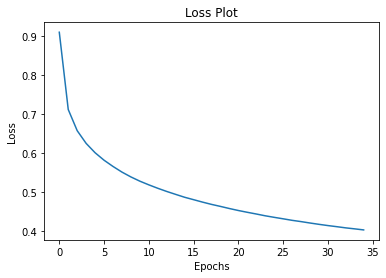

In [ ]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

## Caption!

* The evaluate function is similar to the training loop, except you don't use teacher forcing here. The input to the decoder at each time step is its previous predictions along with the hidden state and the encoder output.
* Stop predicting when the model predicts the end token.

In [ ]:
def evaluate(image):

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    one_hot_input = tf.one_hot(dec_input, vocab_size)

    result = []

    for i in range(max_length):
        predictions, hidden = decoder(one_hot_input, img_tensor_val, hidden)

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            # total_t_loss = (test_loss / len(result))
            return result

        dec_input = tf.expand_dims([predicted_id], 0)
        one_hot_input = tf.one_hot(dec_input, vocab_size)

    return result

In [ ]:
def plot_attention(image, result):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))
    imgplot = plt.imshow(Image.open(image))

    len_result = len(result)

    plt.tight_layout()
    plt.show()

In [ ]:
real_caption_list = []
pred_caption_list = []

In [ ]:
# captions on the validation set
for i in range(20):
  total_test_loss = 0
  rid = np.random.randint(0, len(img_name_val))
  image = img_name_val[rid]
  real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
  result = evaluate(image)
  print ('Real Caption:', real_caption)
  print ('Prediction Caption:', ' '.join(result))

  real_caption_list.append(real_caption)
  pred_caption_list.append(' '.join(result))
  plot_attention(image, result)


## Evaluation!


*   Here we use the nlg-eval script implemented by [Maluuba](https://github.com/Maluuba/nlg-eval)
*   This Python script evaluates the performance of the Image Description model by comparing the predicted caption and reference caption.
*   BLEU, ROUGE, METEOR and CIDEr scores are provided.
*   In order to use the nlg-eval, first it must be downloaded and installed.






In [ ]:
!pip install git+https://github.com/Maluuba/nlg-eval.git@master

In [ ]:
!nlg-eval --setup

In [ ]:
real_file= open("real_captions.txt","w+")
for i in range(len(real_caption_list)):
     real_file.write(real_caption_list[i] + "\n")
real_file.close()

In [ ]:
pred_file= open("pred_captions.txt","w+")
for i in range(len(pred_caption_list)):
     pred_file.write("<start> " + pred_caption_list[i] + "\n")
pred_file.close()

In [ ]:
!nlg-eval --hypothesis=pred_captions.txt --references=real_captions.txt

## Testing with RTA twitter images!

* The evaluate function is used to predict the word sequence for the given images.
* Stops predicting when the model predicts the end token.
*   The RTA images are acquired using the Tweepy API




In [ ]:
!pip install tweepy

In [ ]:
import tweepy
from tweepy import OAuthHandler
from tweepy import API
from tweepy import Cursor
from datetime import datetime, date, time, timedelta
from collections import Counter
import sys
import urllib.request
# import os
from os import path

In [ ]:
#Add twitter developer consumer and access token key to use tweepy API
consumer_key=""
consumer_secret=""
access_token=""
access_token_secret=""

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
auth_api = API(auth)

In [ ]:
target = "rta_dubai"

In [ ]:
if not(path.exists('twitter_data')):
    os.mkdir(os.path.abspath('.') + "/twitter_data/")

In [ ]:
timeline = tweepy.Cursor(auth_api.user_timeline, id=target, tweet_mode='extended').items() 
imagesfiles = [] # this is the list I want the image urls to go into

for tweet in timeline:
        if 'media' in tweet.entities:
            for image in tweet.extended_entities['media']:
                file_location = str(image['media_url'])
                # if os.path.exists(os.path.abspath('.') + "/twitter_data/" + file):
                #   os.remove("demofile.txt")

                imagesfiles.append(file_location)
                file_location = "twitter_data/" + file_location.rsplit('/', 1)[-1]
                urllib.request.urlretrieve(image['media_url'], file_location)
#         else:
#             imagesfiles = "noimages"

In [ ]:
twitter_image_list = os.listdir(os.path.abspath('.') + "/twitter_data/")

Prediction Caption: a person gets ready to serve a baseball board <end>


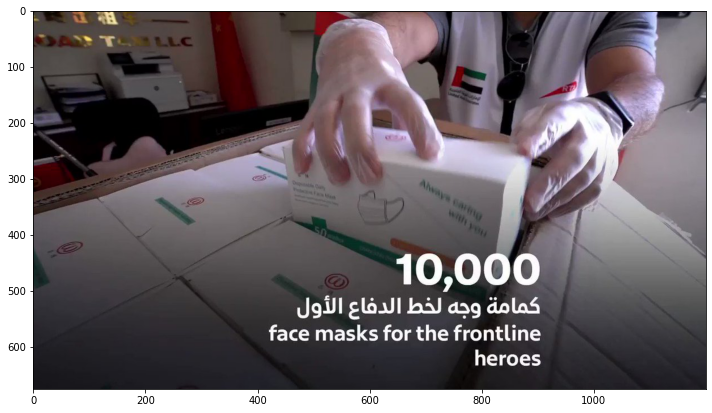

Prediction Caption: a bird sitting next to a set of pictures covered with some people <end>


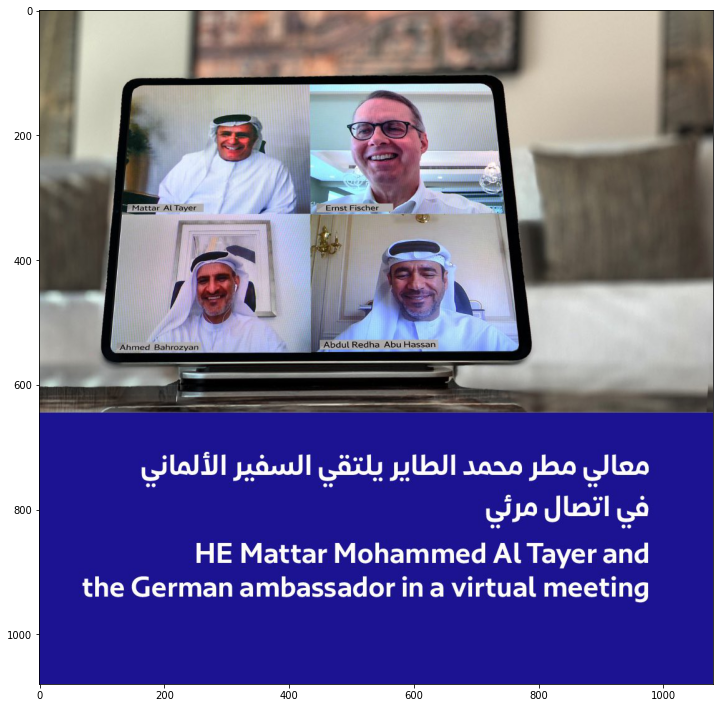

Prediction Caption: a man and woman sitting on a set of bikes <end>


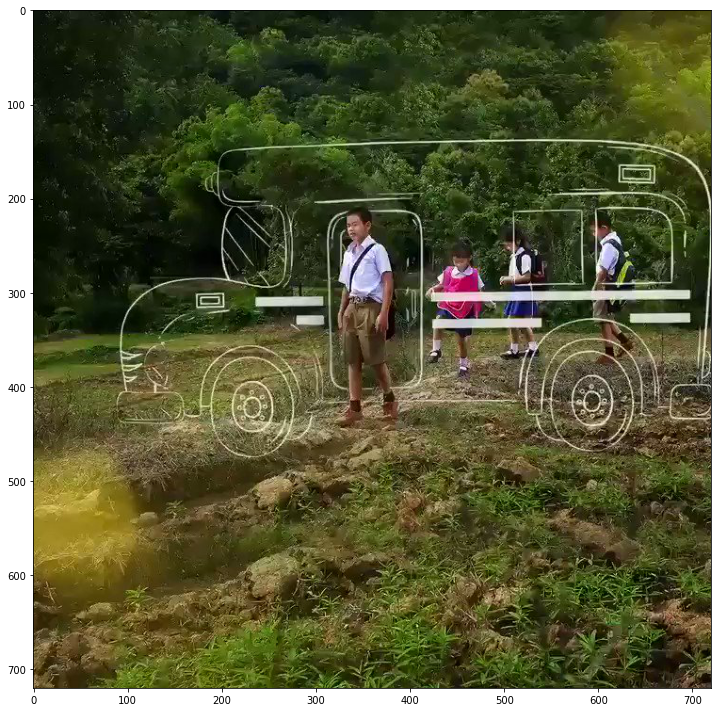

Prediction Caption: a collage of pictures of a man without a cap <end>


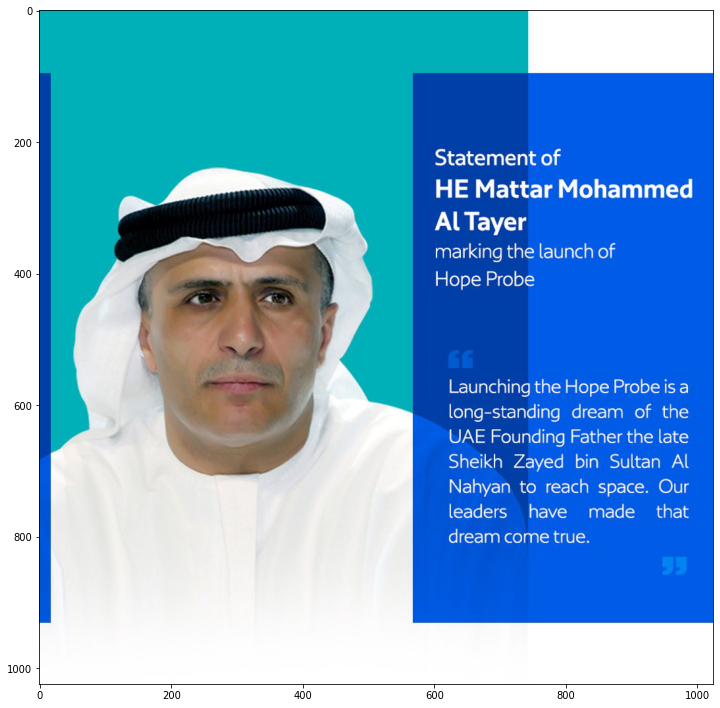

Prediction Caption: an aerial ship used for tables with people <end>


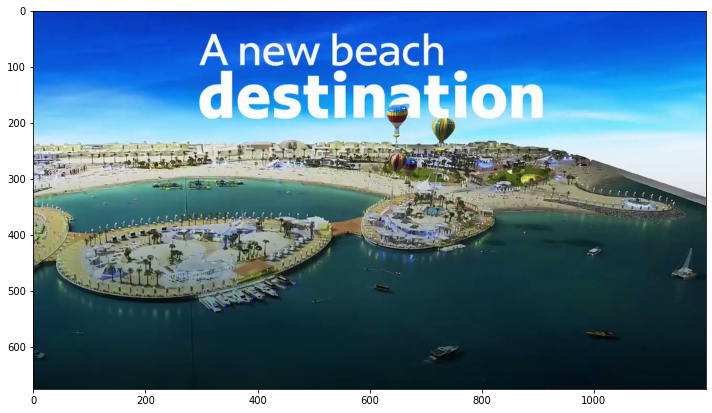

Prediction Caption: a man in a straw dress standing in a trophy <end>


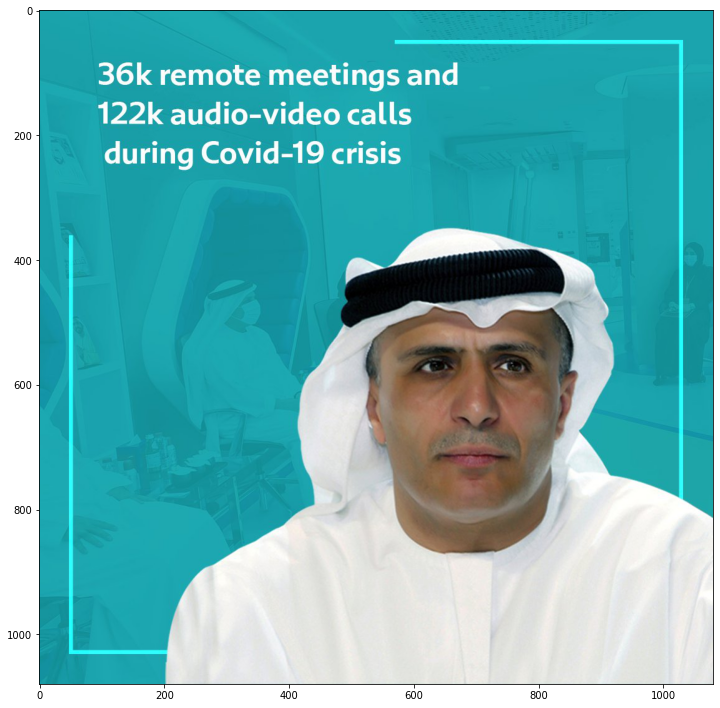

Prediction Caption: a blue screen blue object showing which hangs <end>


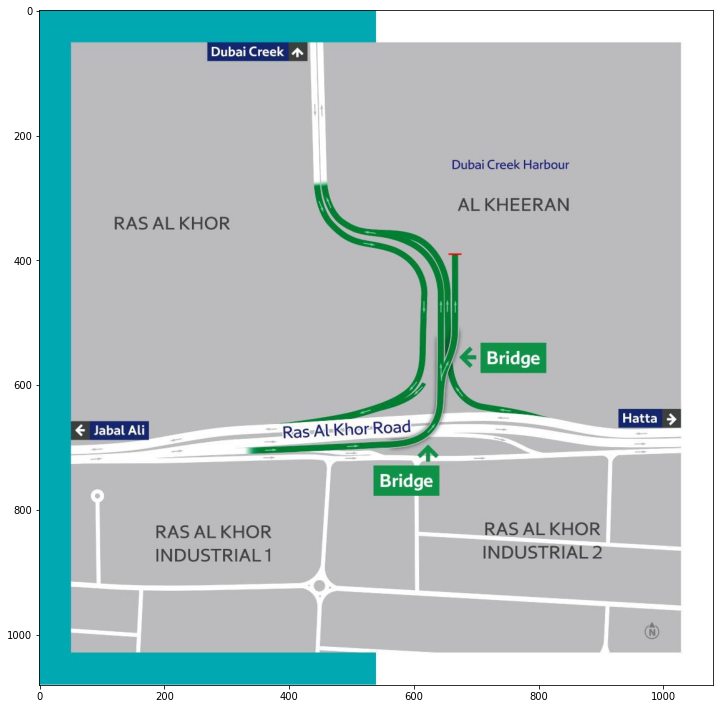

Prediction Caption: several air drawing part of many eight lines in the airport <end>


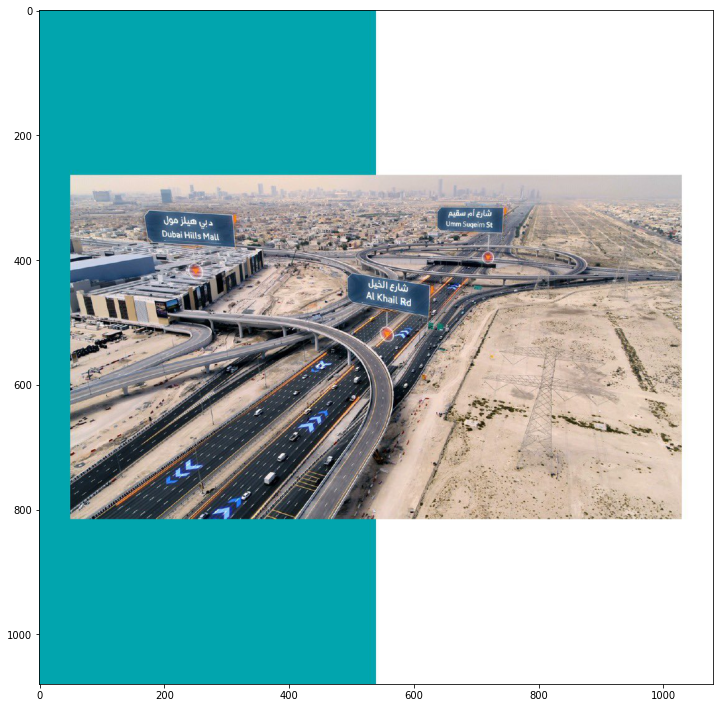

Prediction Caption: a couple of feet sitting on a couch next to a couple of labels <end>


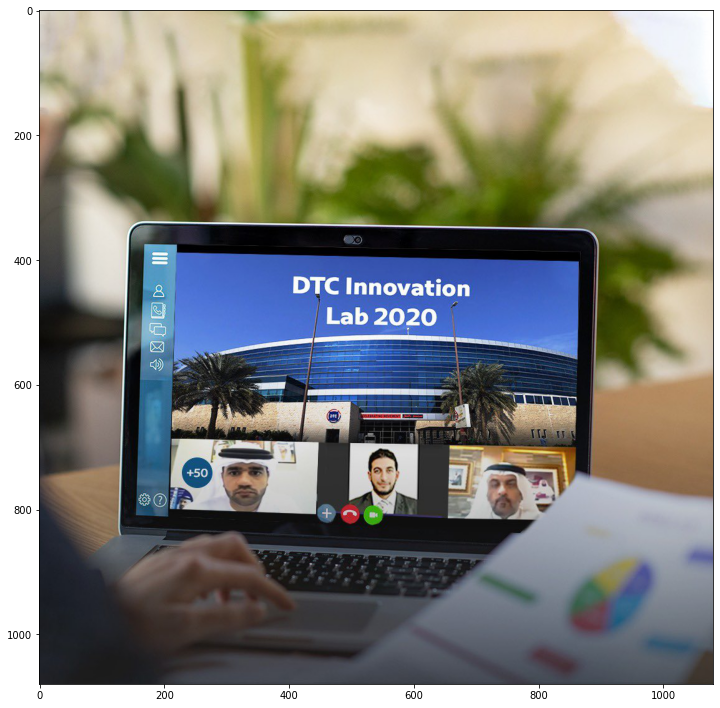

Prediction Caption: a track lined up street with many cars in the middle <end>


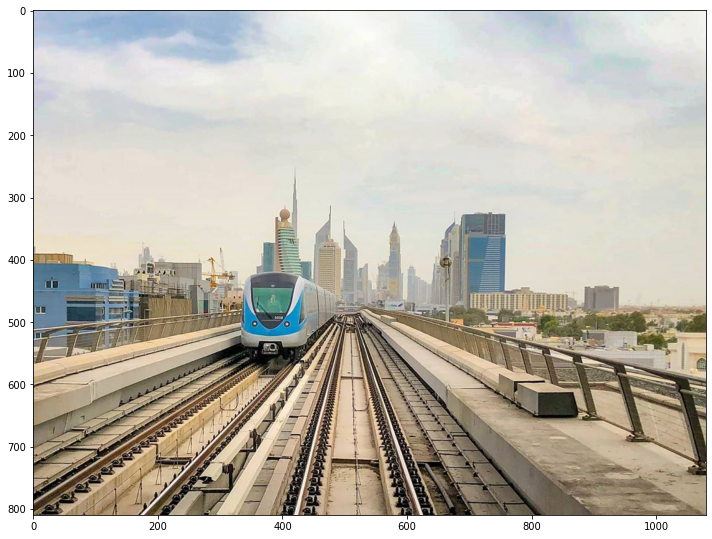

Prediction Caption: a sports vehicle with a clear pile <end>


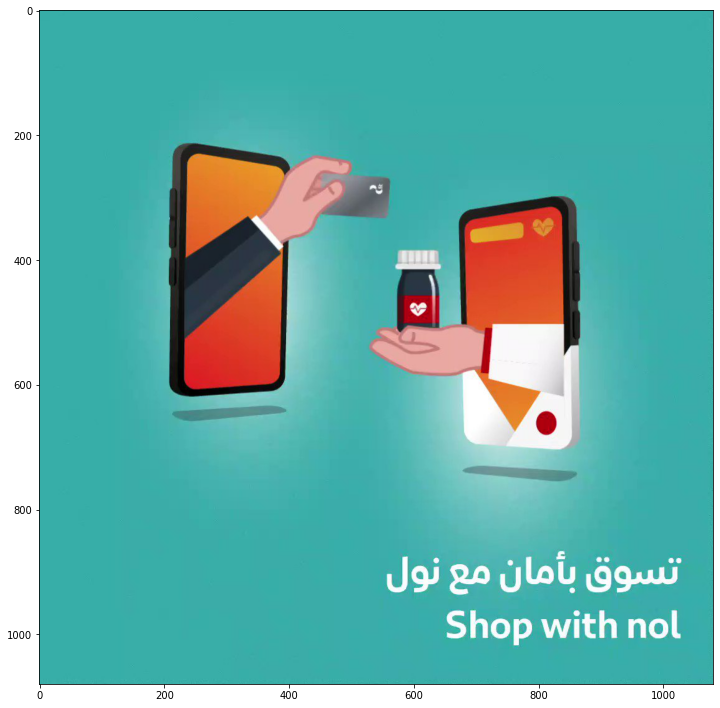

Prediction Caption: a pair of writing on a pole in front of a mirror <end>


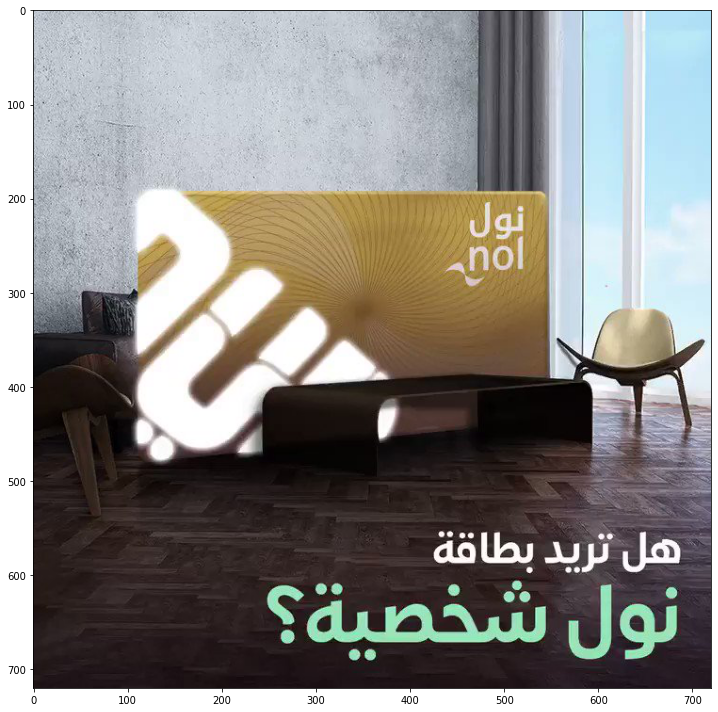

Prediction Caption: a black cat lying on the ground and notepad into the dark <end>


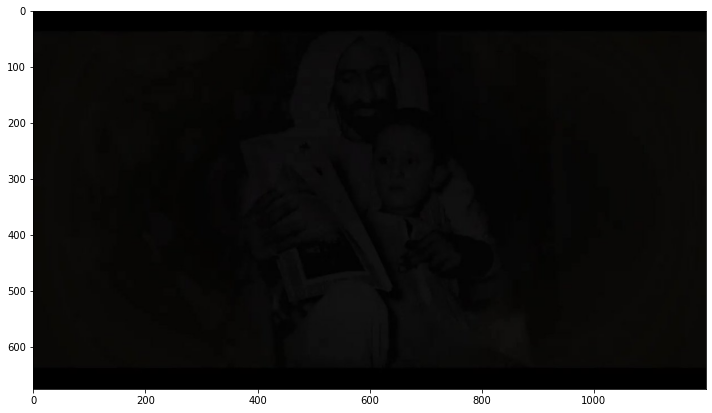

Prediction Caption: a man on a horse is moving loading with beverage <end>


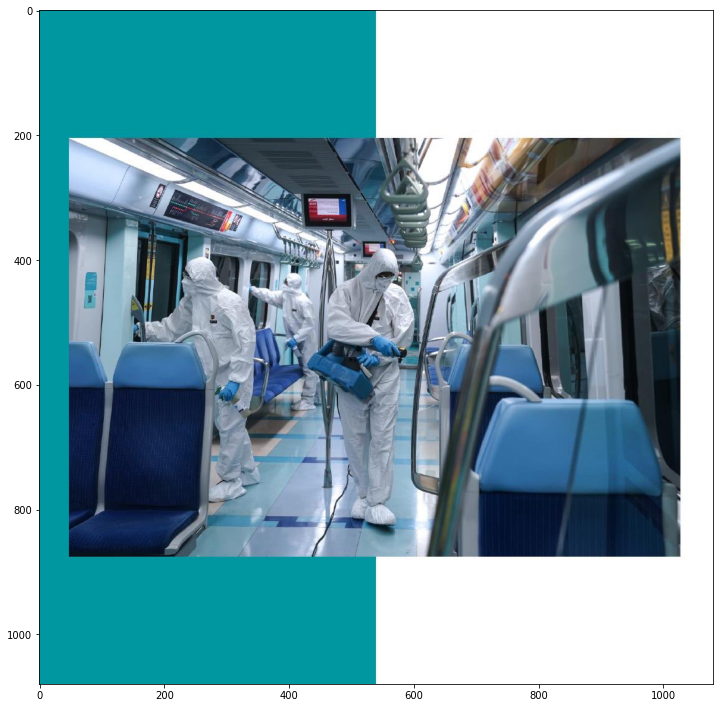

Prediction Caption: a couple of different bags parked on display at a train stop <end>


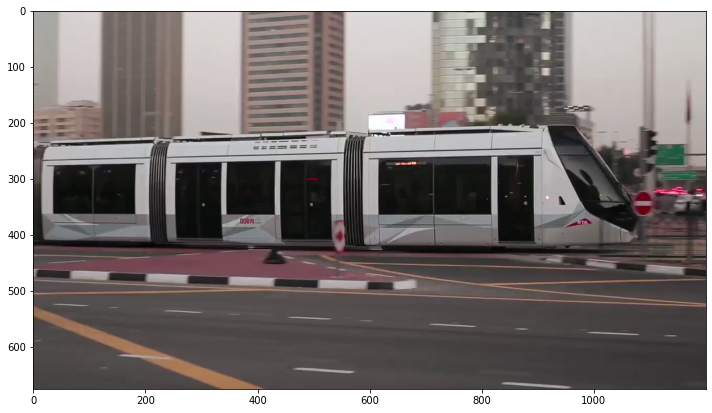

Prediction Caption: a white sign that is in the air with a stop light <end>


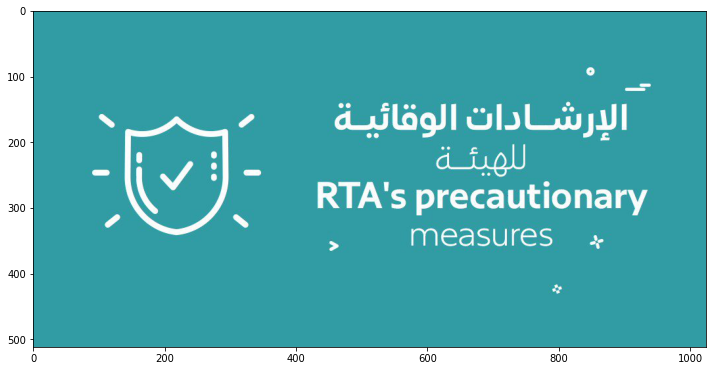

Prediction Caption: this motorcycle is racing down a closed moving bike <end>


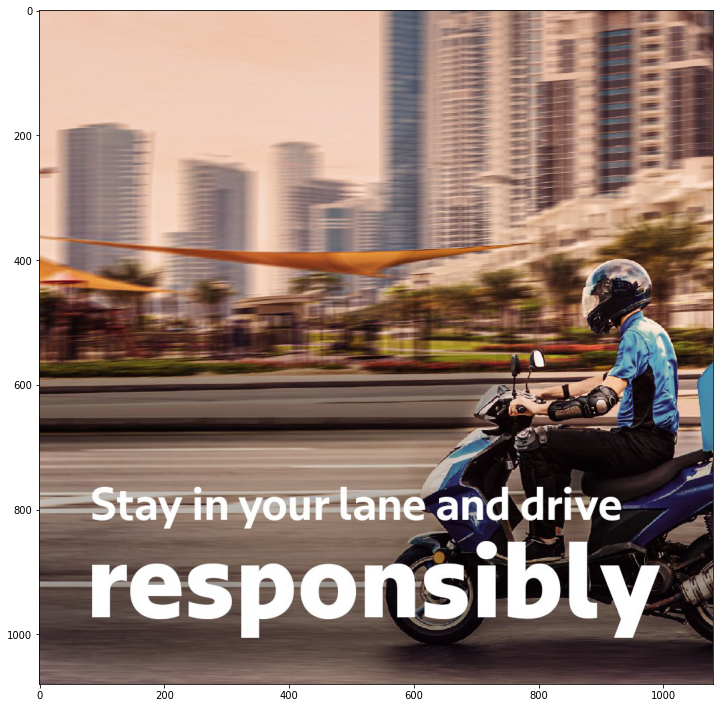

Prediction Caption: a stop sign for a brown and white for night including a store <end>


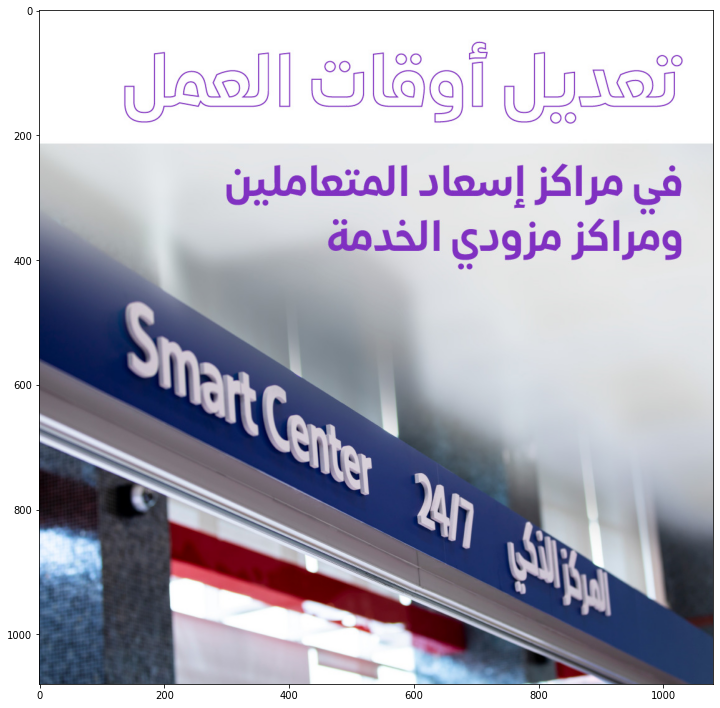

Prediction Caption: some books including scissors and their hands in a person's hand <end>


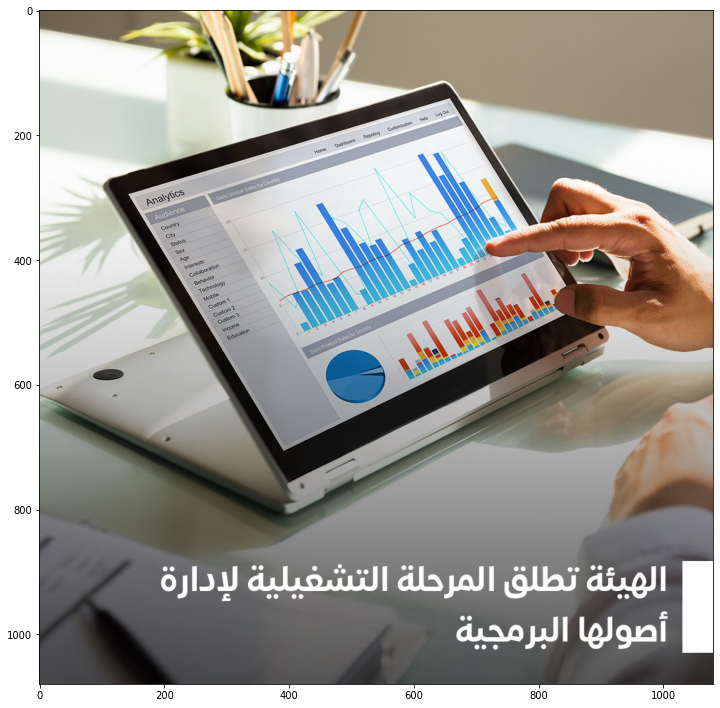

Prediction Caption: a woman looks up as she cub dressed image of a woman looking at her cell phone <end>


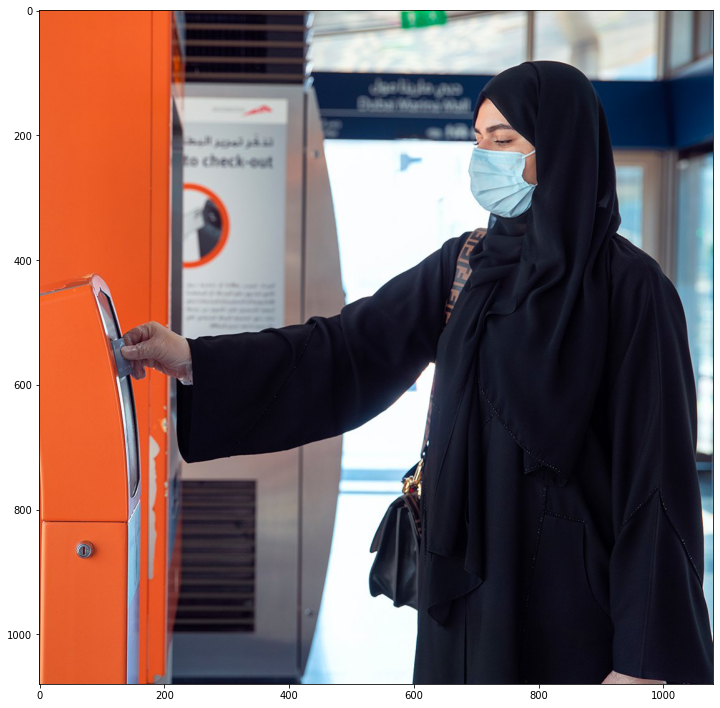

Prediction Caption: a city bus parked at this double public area traveling <end>


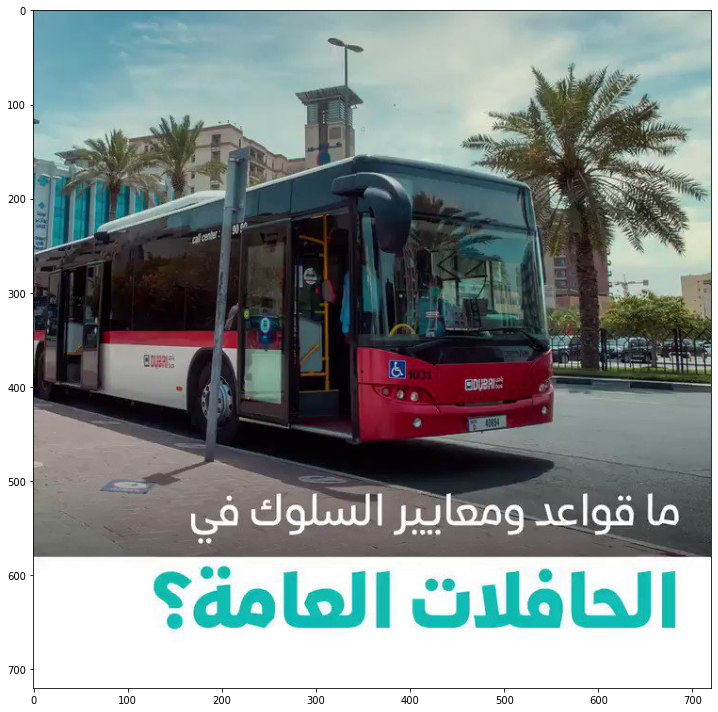

Prediction Caption: there is a close up of orange flying a bright window <end>


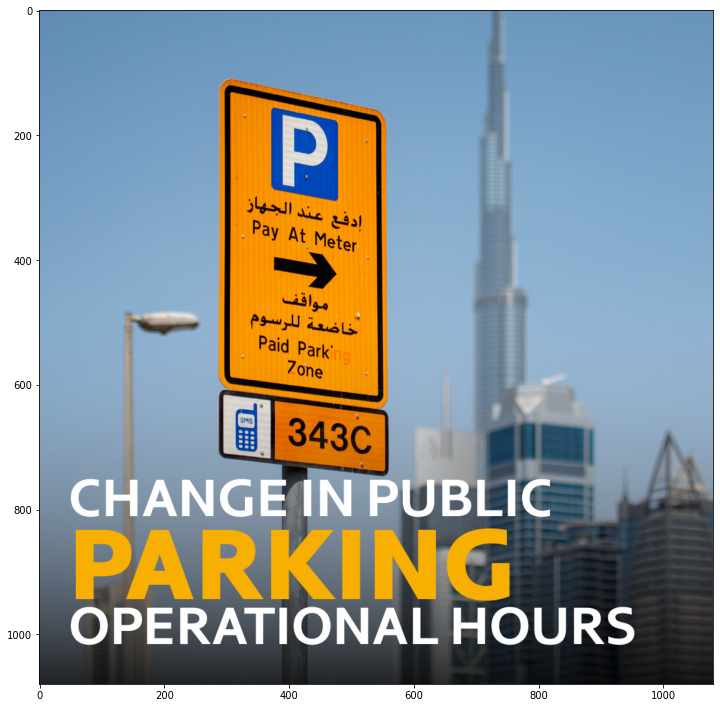

Prediction Caption: a blue and yellow athlete sitting on a sandy surface <end>


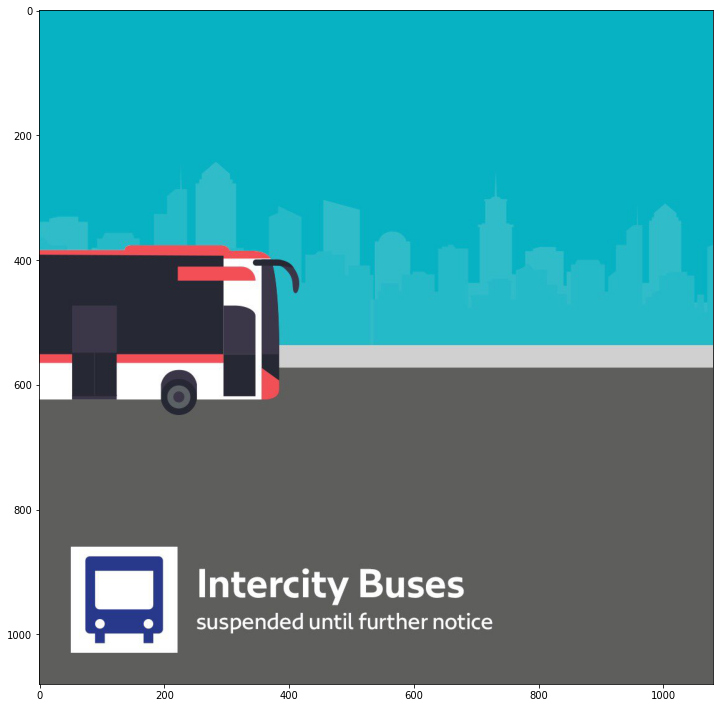

Prediction Caption: someone celebrating the blue skies across the blue hands <end>


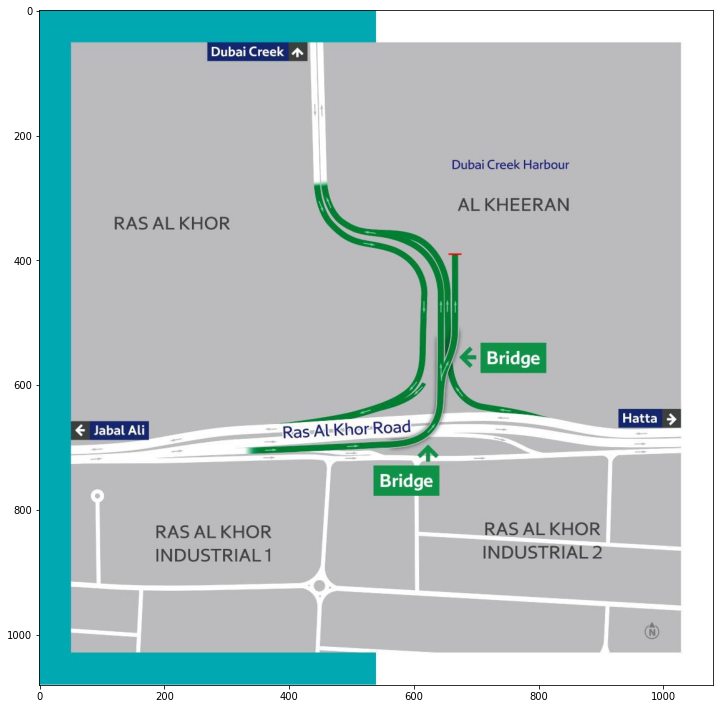

Prediction Caption: a person that has a surf board in his hands <end>


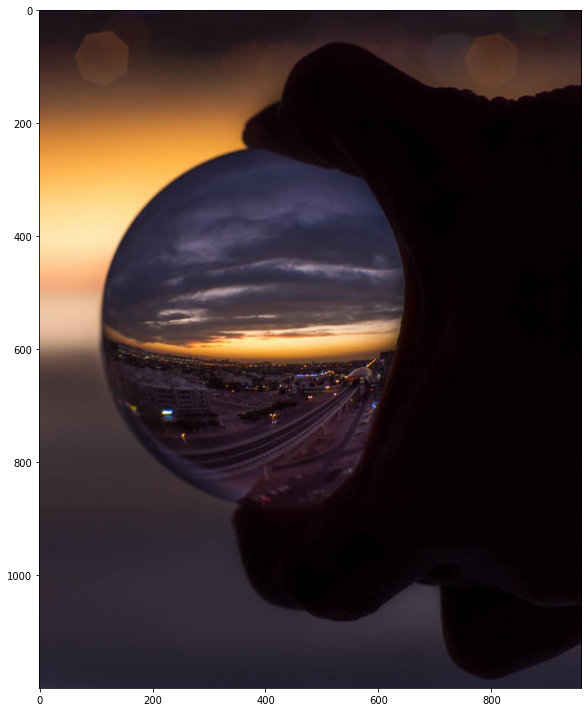

Prediction Caption: a street view of a metal building in a bush <end>


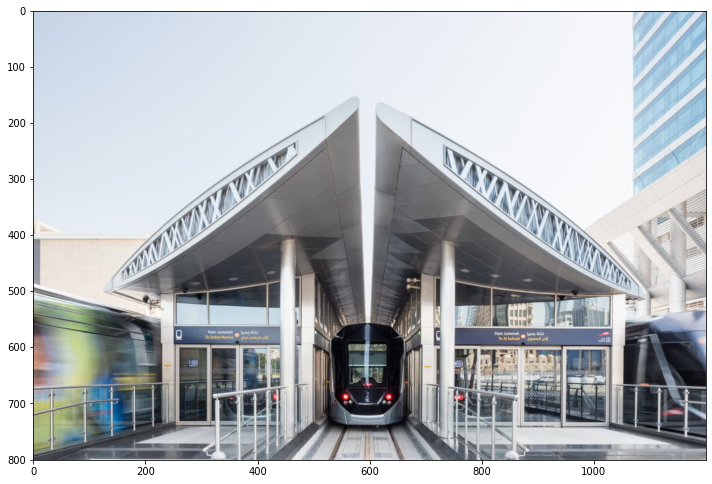

Prediction Caption: double decker buses parked on street with busy and buildings <end>


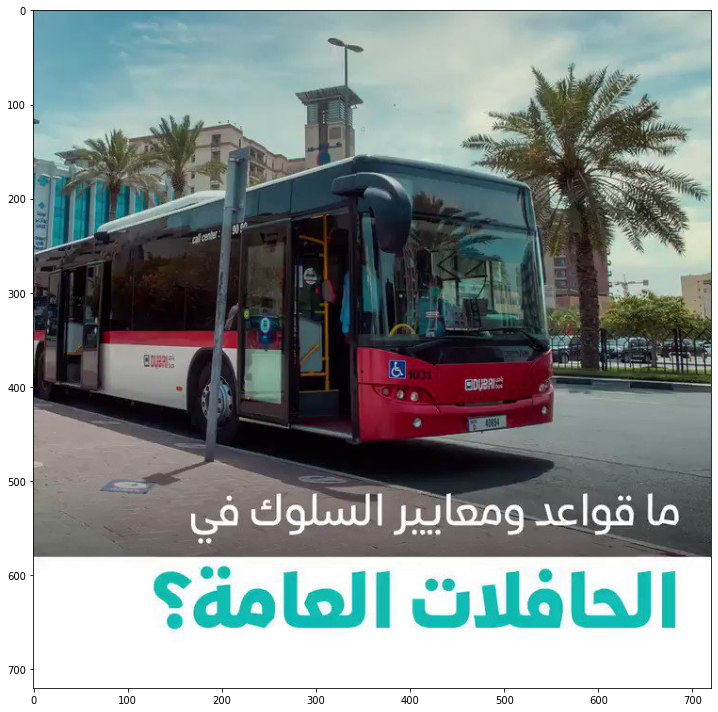

Prediction Caption: girl holding onto a shoe of bread on the shoe <end>


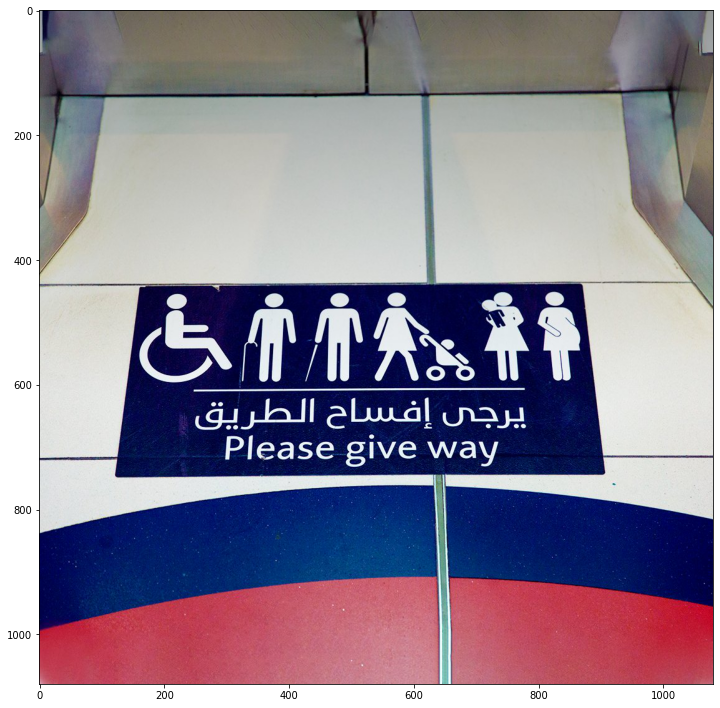

Prediction Caption: a small thin blue plastic suit with a close up suit top and green foreign words board <end>


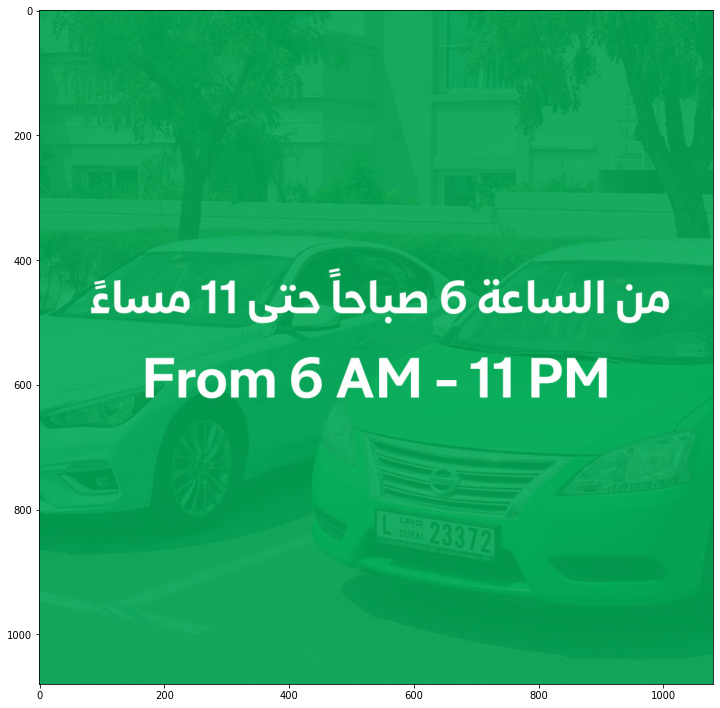

Prediction Caption: a small horse lifting a red sign at a baseball field <end>


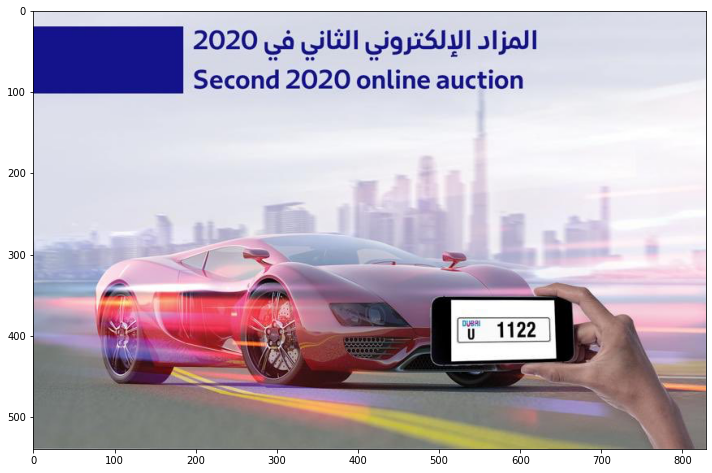

In [ ]:
for i in range(30):
  rid = np.random.randint(0, len(twitter_image_list))
  image = os.path.abspath('.') + "/twitter_data/" + twitter_image_list[rid]
  target_caption_list = ['']
  # real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
  result = evaluate(image)
  # test_loss_plot.append(t_loss)

  # print ('Real Caption:', real_caption)
  print ('Prediction Caption:', ' '.join(result))

  # metrics_dict = compute_individual_metrics(real_caption, ' '.join(result))
  # print(metrics_dict)


  # real_caption_list.append(real_caption)
  pred_caption_list.append(' '.join(result))

  plot_attention(image, result)